## Analisi Dati aggregati Pendolari Tutto Febbraio 2019


In [4]:
import geopandas as gpd
import fiona as fio
import numpy as np

In [5]:
import warnings
warnings.filterwarnings('ignore')
import skmob
from skmob.preprocessing import filtering
from skmob.preprocessing import compression
from skmob.utils import plot
import folium
from folium import plugins
import pandas as pd
from folium.plugins import HeatMap
import matplotlib.pyplot as plt
from stats_utils import *
from skmob.utils.plot import *
from skmob.data.load import *

In [ ]:
import paramiko

hostname = "kddrtserver10.isti.cnr.it"
username = "avitali"
remote_directory = "/home/avitali"

try:
    ssh = paramiko.SSHClient()
    ssh.set_missing_host_key_policy(paramiko.AutoAddPolicy())
    ssh.connect(hostname, username=username)


    sftp = ssh.open_sftp()

    files = sftp.listdir(remote_directory)
    count=0
    for file in files:
        count+=1
        print(file)
    print (count)


except Exception as e:
    print(f"An error occurred: {e}")

finally:
    if sftp:
        sftp.close()
    if ssh:
        ssh.close()

### per leggere file da server (aggiornato)

In [ ]:
import paramiko
import geopandas as gpd
import io
from datetime import datetime  

hostname = "kddrtserver10.isti.cnr.it"
username = "avitali"
file = "Commuters_Febbraio2019.geojson"

try:
    start_time = datetime.now()
    print(f"Process started at: {start_time.strftime('%Y-%m-%d %H:%M:%S')}")
    #apro connessione ssh
    print("Connecting to SSH server...")
    ssh = paramiko.SSHClient()
    ssh.set_missing_host_key_policy(paramiko.AutoAddPolicy())
    ssh.connect(hostname, username=username)
    print("Connection to SSH server established")

    print("Opening sftp connection...")
    sftp = ssh.open_sftp()
    print("sftp connection opened")

    
    try:
        print(f"Opening file {file}")
        with sftp.open(f"/home/avitali/{file}", "r") as remote_file: #apre il file remoto utilizzando la connessione sftp creata da paramiko
            print(f"Opened remote file: {file}")
            print("Reading file content from remote server...")
            # legge il contenuto
            file_content = remote_file.read() #Legge l'intero contenuto del file remoto in memoria come una stringa binaria.
            print(f"Finished reading file. File size: {len(file_content)} bytes.") 
            
            print("Creating in-memory buffer for the GeoJSON file...")
            #Creazione di un buffer in memoria # in teoria ottimizza lettura perché evita di salvare sul disco
            geojson_buffer = io.BytesIO(file_content) #Trasforma file_content (che è una stringa binaria) in un oggetto simile a un file usando io.BytesIO.
            print("Buffer created successfully. Starting GeoJSON parsing.") #La variabile geojson_buffer diventa un file virtuale in memoria, che può essere utilizzato come un file reale.
            # Con GeoPandas per leggere il contenuto del buffer geojson e trasformarlo in un GeoDataFrame.
            gdf = gpd.read_file(geojson_buffer)
            print(f"Successfully read: {file}")
            print(f"Number of rows: {len(gdf)}")
            print(gdf.head(2))

    except Exception as e:
        print(f"Failed to read {file_path}: {e}")
        
    
    
    finally:
        # chiude SFTP session
        if sftp:
            sftp.close()
            
    end_time = datetime.now()
    print(f"Process completed at: {end_time.strftime('%Y-%m-%d %H:%M:%S')}")
    print(f"Total processing time: {end_time - start_time}")    

except Exception as e:
    print(f"An error occurred while connecting to the server: {e}")

finally:
    # chiude SSH connection
    if ssh:
        ssh.close()
        print("Connections closed.")


ID_ANONYMOUS,DAY,HH24,LATITUDE,LONGITUDE,SPEED,HEADING,QUALITY,ID_PANELSESSION,DELTAPOS

Ovvero le ultime colonne sono la velocità (km/h, credo) , direzione (gradi, 0 = nord, non mi ricordo se in senso orario), qualità del segnale (è consigliato buttare via quelli < 3), stato del veicolo (0=accensione, 1=in moto, 2=spegnimento), distanza in metri dal punto precedente.

In [ ]:
gdf

In [7]:
print(gdf.crs)


epsg:4326


In [8]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 84519 entries, 0 to 84518
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   id            84519 non-null  object  
 1   Date          84519 non-null  object  
 2   DeltaPos      84519 non-null  int64   
 3   Heading       84519 non-null  int64   
 4   ID            84519 non-null  int64   
 5   Latitude      84519 non-null  float64 
 6   Longitude     84519 non-null  float64 
 7   PanelSession  84519 non-null  int64   
 8   Speed         84519 non-null  int64   
 9   Time          84519 non-null  object  
 10  Timestamp     84519 non-null  object  
 11  geometry      84519 non-null  geometry
dtypes: float64(2), geometry(1), int64(5), object(4)
memory usage: 7.7+ MB


In [538]:
gdf

,id,Date,DeltaPos,Heading,ID,Latitude,Longitude,PanelSession,Speed,Time,Timestamp,geometry
0,0,2019-02-01,78,356,5514,43.768072,11.287648,1,4,06:48:47,2019-02-01 06:48:47,POINT (11.28765 43.76807)
1,1,2019-02-01,43,22,5514,43.768419,11.287818,1,22,06:49:35,2019-02-01 06:49:35,POINT (11.28782 43.76842)
2,2,2019-02-01,430,98,5514,43.768434,11.292807,1,52,06:50:11,2019-02-01 06:50:11,POINT (11.29281 43.76843)
3,3,2019-02-01,303,0,5514,43.768000,11.296633,1,0,06:50:47,2019-02-01 06:50:47,POINT (11.29663 43.76800)
4,4,2019-02-01,0,352,5514,43.768058,11.296517,1,4,06:51:24,2019-02-01 06:51:24,POINT (11.29652 43.76806)
...,...,...,...,...,...,...,...,...,...,...,...,...
84514,84514,2019-02-28,913,96,891366,43.770293,11.177649,1,102,12:55:31,2019-02-28 12:55:31,POINT (11.17765 43.77029)
84515,84515,2019-02-28,793,134,891366,43.770438,11.187430,1,44,12:56:07,2019-02-28 12:56:07,POINT (11.18743 43.77044)
84516,84516,2019-02-28,230,0,891366,43.768589,11.189039,1,0,12:56:44,2019-02-28 12:56:44,POINT (11.18904 43.76859)
84517,84517,2019-02-28,133,294,891366,43.769358,11.189124,1,32,12:57:21,2019-02-28 12:57:21,POINT (11.18912 43.76936)


In [7]:
type(gdf)

geopandas.geodataframe.GeoDataFrame

<Figure size 1500x1500 with 0 Axes>

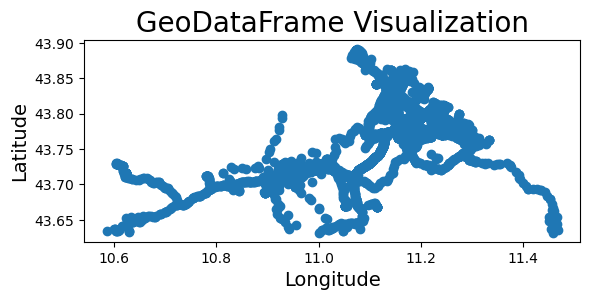

In [8]:
import matplotlib.pyplot as plt


plt.figure(figsize=(15, 15)) 
gdf.head(5000).plot()


plt.title("GeoDataFrame Visualization", fontsize=20)
plt.xlabel("Longitude", fontsize=14)
plt.ylabel("Latitude", fontsize=14)


plt.show()


In [29]:
gdf['ID'].unique()

array([  5514,  89001,  89909, 120617, 122711, 134643, 136295, 167834,
       186115, 188859, 194213, 241704, 253545, 259780, 261668, 269269,
       270033, 272297, 289947, 304492, 324242, 352469, 354872, 355260,
       361991, 424643, 445765, 484424, 502875, 515060, 521426, 556920,
       569861, 569958, 570789, 584136, 642671, 694607, 702805, 764720,
       830176, 850911, 865983, 876930, 891366,  69887, 742889])

## Trasformiamo il gdf in trajectorydf

In [9]:
gdf['Timestamp']=pd.to_datetime(gdf['Timestamp'])


In [10]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 84519 entries, 0 to 84518
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   id            84519 non-null  object        
 1   Date          84519 non-null  object        
 2   DeltaPos      84519 non-null  int64         
 3   Heading       84519 non-null  int64         
 4   ID            84519 non-null  int64         
 5   Latitude      84519 non-null  float64       
 6   Longitude     84519 non-null  float64       
 7   PanelSession  84519 non-null  int64         
 8   Speed         84519 non-null  int64         
 9   Time          84519 non-null  object        
 10  Timestamp     84519 non-null  datetime64[ns]
 11  geometry      84519 non-null  geometry      
dtypes: datetime64[ns](1), float64(2), geometry(1), int64(5), object(3)
memory usage: 7.7+ MB


In [11]:
from skmob import TrajDataFrame


tdf = TrajDataFrame(gdf, timestamp=True, latitude='Latitude', longitude='Longitude', datetime='Timestamp', user_id='ID')

print("\nTrajDataFrame:")
print(tdf.columns)
print(tdf.head())



TrajDataFrame:
Index(['id', 'Date', 'DeltaPos', 'Heading', 'uid', 'lat', 'lng',
       'PanelSession', 'Speed', 'Time', 'datetime', 'geometry'],
      dtype='object')
  id        Date  DeltaPos  Heading   uid        lat        lng  PanelSession  \
0  0  2019-02-01        78      356  5514  43.768072  11.287648             1   
1  1  2019-02-01        43       22  5514  43.768419  11.287818             1   
2  2  2019-02-01       430       98  5514  43.768434  11.292807             1   
3  3  2019-02-01       303        0  5514  43.768000  11.296633             1   
4  4  2019-02-01         0      352  5514  43.768058  11.296517             1   

   Speed      Time            datetime                   geometry  
0      4  06:48:47 2019-02-01 06:48:47  POINT (11.28765 43.76807)  
1     22  06:49:35 2019-02-01 06:49:35  POINT (11.28782 43.76842)  
2     52  06:50:11 2019-02-01 06:50:11  POINT (11.29281 43.76843)  
3      0  06:50:47 2019-02-01 06:50:47  POINT (11.29663 43.76800)  
4    

In [12]:
tdf = tdf.sort_values(by=['uid', 'datetime'])
print('\nAnalysis:')
print('records:', len(tdf))
print('unique users:', len(tdf['uid'].unique()))
print('period:', tdf.datetime.min(), '-', tdf.datetime.max())


Analysis:
records: 84519
unique users: 47
period: 2019-02-01 00:00:15 - 2019-02-28 22:07:13


In [15]:
uid=tdf.groupby('uid').size().sort_values(ascending=False)
uid.head(10)

uid
850911    7381
134643    6872
5514      5368
167834    4948
304492    4914
188859    3979
515060    3511
352469    3511
241704    3361
742889    3150
dtype: int64

## Frequenza di guida

In [14]:
tdf

,id,Date,DeltaPos,Heading,uid,lat,lng,PanelSession,Speed,Time,datetime,geometry
0,0,2019-02-01,78,356,5514,43.768072,11.287648,1,4,06:48:47,2019-02-01 06:48:47,POINT (11.28765 43.76807)
1,1,2019-02-01,43,22,5514,43.768419,11.287818,1,22,06:49:35,2019-02-01 06:49:35,POINT (11.28782 43.76842)
2,2,2019-02-01,430,98,5514,43.768434,11.292807,1,52,06:50:11,2019-02-01 06:50:11,POINT (11.29281 43.76843)
3,3,2019-02-01,303,0,5514,43.768000,11.296633,1,0,06:50:47,2019-02-01 06:50:47,POINT (11.29663 43.76800)
4,4,2019-02-01,0,352,5514,43.768058,11.296517,1,4,06:51:24,2019-02-01 06:51:24,POINT (11.29652 43.76806)
...,...,...,...,...,...,...,...,...,...,...,...,...
84514,84514,2019-02-28,913,96,891366,43.770293,11.177649,1,102,12:55:31,2019-02-28 12:55:31,POINT (11.17765 43.77029)
84515,84515,2019-02-28,793,134,891366,43.770438,11.187430,1,44,12:56:07,2019-02-28 12:56:07,POINT (11.18743 43.77044)
84516,84516,2019-02-28,230,0,891366,43.768589,11.189039,1,0,12:56:44,2019-02-28 12:56:44,POINT (11.18904 43.76859)
84517,84517,2019-02-28,133,294,891366,43.769358,11.189124,1,32,12:57:21,2019-02-28 12:57:21,POINT (11.18912 43.76936)


In [16]:
usage_counts = tdf.groupby('uid')['Date'].nunique()

In [32]:
usage_counts.sort_values(ascending=False).head(50)

uid
5514      28
188859    28
89001     28
89909     28
269269    28
304492    28
570789    28
642671    28
324242    28
764720    27
445765    27
850911    27
134643    27
272297    27
355260    26
569958    26
876930    26
521426    26
424643    25
584136    25
569861    25
830176    25
865983    25
361991    25
354872    25
241704    25
270033    25
167834    25
194213    25
891366    25
515060    24
289947    24
261668    23
186115    22
122711    22
259780    22
352469    22
69887     21
502875    20
702805    20
136295    20
694607    20
742889    18
484424    18
120617    18
556920     9
253545     8
Name: Date, dtype: int64

In [17]:
df = usage_counts.reset_index()

In [18]:
df

,uid,Date
0,5514,28
1,69887,21
2,89001,28
3,89909,28
4,120617,18
5,122711,22
6,134643,27
7,136295,20
8,167834,25
9,186115,22


In [19]:
df.columns = ['uid', 'days_used']

In [20]:
grouped_counts = df.groupby('days_used')['uid'].nunique().reset_index()

In [21]:
grouped_counts

,days_used,uid
0,8,1
1,9,1
2,18,3
3,20,4
4,21,1
5,22,4
6,23,1
7,24,2
8,25,12
9,26,4


In [ ]:
import altair as alt
chart = alt.Chart(grouped_counts).mark_bar().encode(
    y=alt.Y('days_used:N', title='Days used', sort='descending'),  
    x=alt.X('uid:Q'), 
    color=alt.Color('uid:Q', scale=alt.Scale(scheme='reds'), title="Number of individual user"),
    tooltip=[alt.Tooltip('uid:Q', title='Number of Users')]  
).properties(
    width=500,   
    height=300,
    title="Frequency of use of Pendolari group "
)

chart.show()

In [23]:
usage_dict = {}
for num_days in usage_counts.unique():
    ids = usage_counts[usage_counts == num_days].index
    usage_dict[num_days] = {id_: list(tdf[tdf['uid'] == id_]['Date'].unique()) for id_ in ids}

In [43]:
print(usage_dict[8])

{253545: ['2019-02-01', '2019-02-02', '2019-02-09', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15']}


In [24]:
usage_dict.keys()

dict_keys([28, 21, 18, 22, 27, 20, 25, 8, 23, 24, 26, 9])

In [25]:
gruppo=input('Choose group:')
gruppo = int(gruppo)
rows=[]
for uid, dates in usage_dict[gruppo].items():
    for date in dates:
     rows.append({"uid": uid, "date": date})
dynamic_name = f"group_{gruppo}"
globals()[dynamic_name] = pd.DataFrame(rows)
        

Choose group: 25


In [ ]:
import altair as alt


date_counts = group_25.groupby('date').size().reset_index(name='count')


chart = alt.Chart(date_counts).mark_bar(size=10).encode(
    x=alt.X('date:T', title='Date', timeUnit='yearmonthdate'),  
    y=alt.Y('count:Q', title='Number of Users'),
    tooltip=[
        alt.Tooltip('date:T', title='Date'),  
        alt.Tooltip('count:Q', title='Number of Users')
    ]
).properties(
    title="Distribution of Dates for Group 25",
    width=600,
    height=300
)

chart.show()


## Pulizia e compressione

### Filtriamo le traiettorie
Qui facciamo un filtro delle traiettorie togliendo quelle che sono potenzialmente errori del GPS. 
Scartiamo velocità superiori a 150km/h

In [83]:
%%time
f_tdf = filtering.filter(tdf, max_speed_kmh=150.0)
print('Number of records:\t%s'%len(f_tdf))
print('Filtered points:\t%s'%(len(tdf) - len(f_tdf)))

Number of records:	84450
Filtered points:	69
CPU times: user 1.4 s, sys: 50.8 ms, total: 1.45 s
Wall time: 1.45 s


In [ ]:
map_f = f_tdf.plot_trajectory(zoom=13, max_users=50, start_end_markers=False) 
map_f

### Comprimiamo le traiettorie

Con questo passaggio cerchiamo di alleggerire in dataset senza perdere troppa granularità. Comprimiamo i punti delle traiettorie che sono entro un raggio di 100 metri in un punto solo. 

In [84]:
%%time
fc_tdf = compression.compress(f_tdf, spatial_radius_km=0.1) #punti entro 100 metri sono rimossi
print('Points of the filtered trajectory:\t%s'%len(f_tdf))
print('Points of the compressed trajectory:\t%s'%len(fc_tdf))
print('Compressed points:\t\t\t%s'%(len(f_tdf)-len(fc_tdf)))

Points of the filtered trajectory:	84450
Points of the compressed trajectory:	65068
Compressed points:			19382
CPU times: user 3.93 s, sys: 27.2 ms, total: 3.96 s
Wall time: 3.97 s


In [ ]:
map_f = fc_tdf.plot_trajectory(zoom=13, max_users=5, start_end_markers=False) #visualizza le traiettorie dei 50 utenti
map_f

## Stops detection

Stops detection.

Detect the stay locations (or stops) for each individual in a TrajDataFrame. A stop is detected when the individual spends at least minutes_for_a_stop minutes within a distance stop_radius_factor * spatial_radius km from a given trajectory point. The stop’s coordinates are the median latitude and longitude values of the points found within the specified distance 

In [166]:
from skmob.preprocessing import detection

In [167]:
 stays= skmob.preprocessing.detection.stay_locations(
     fc_tdf, minutes_for_a_stop=20.0, spatial_radius_km=0.2)

In [168]:
stays.head(1)

,id,Date,DeltaPos,Heading,uid,lat,lng,PanelSession,Speed,Time,datetime,geometry,leaving_datetime
0,58,2019-02-01,142,0,5514,43.772773,11.15268,1,0,07:25:37,2019-02-01 07:24:51,POINT (11.152065 43.772987),2019-02-01 17:46:21


In [ ]:
import folium

map_f = folium.Map(location=[43.7696, 11.2558], zoom_start=9, tiles='cartodbpositron')

for index, row in stays.iterrows():
    folium.Circle(
        radius=100,
        location=[row['lat'], row['lng']],
        color="crimson",
        fill=True,
        opacity=0.5,
        popup=f"date: {row['datetime']}"
    ).add_to(map_f)

map_f

### Mappiamo le stays sulla tesselazione

Con la funzione mapping associamo ogni stay alla sua tile corrispondente


In [180]:
tessellation=gpd.read_file('Internship/TessellationToscana.geojson', driver='GeoJSON')

In [181]:
tessellation['tile_ID']=range(len(tessellation))

In [ ]:
tessellation.plot()

In [182]:
from shapely.geometry import MultiPolygon, Polygon

In [ ]:
t_exp=tessellation.explode(index_parts=True)
set(t_exp['geometry'])

In [ ]:
t_exp.plot()

In [185]:
help(stays.mapping)

Help on method mapping in module skmob.core.trajectorydataframe:

mapping(tessellation, remove_na=False) method of skmob.core.trajectorydataframe.TrajDataFrame instance
    Assign each point of the TrajDataFrame to the corresponding tile of a spatial tessellation.
    
    Parameters
    ----------
    tessellation : GeoDataFrame
        the spatial tessellation containing a geometry column with points or polygons.
        
    remove_na : boolean, optional
        if `True`, remove points that do not have a corresponding tile in the spatial tessellation. The default is `False`.
    
    Returns
    -------
    TrajDataFrame
        a TrajDataFrame with an additional column `tile_ID` indicating the tile identifiers.
    
    Examples
    --------
    >>> import skmob
    >>> from skmob.tessellation import tilers
    >>> import pandas as pd
    >>> from skmob.preprocessing import filtering
    >>> # read the trajectory data (GeoLife, Beijing, China)
    >>> url = skmob.utils.constants.G

In [177]:
map_stays = stays.mapping(t_exp)
map_stays.head(2)

,id,Date,DeltaPos,Heading,uid,lat,lng,PanelSession,Speed,Time,datetime,geometry,leaving_datetime,tile_ID
0,58,2019-02-01,142,0,5514,43.772773,11.152680,1,0,07:25:37,2019-02-01 07:24:51,POINT (11.152065 43.772987),2019-02-01 17:46:21,106
1,133,2019-02-01,186,358,5514,43.767858,11.287461,1,8,18:23:34,2019-02-01 18:23:34,POINT (11.287464 43.76785),2019-02-02 08:03:17,84


In [178]:
map_stays_5514=map_stays[map_stays['uid']==5514]

In [ ]:
tess_style = {'color':'grey', 'fillColor':'black', 'weight':0.5}
popup_features=['tile_ID']
map_f = plot.plot_gdf(t_exp, zoom=10, style_func_args=tess_style, 
             popup_features=popup_features)
map_f = map_stays_5514.plot_stops(map_f=map_f)
map_f

In [186]:
count=map_stays.groupby('tile_ID').count().reset_index()[['tile_ID', 'uid']].rename(columns={'uid': 'n_points'})

In [187]:
count

,tile_ID,n_points
0,38,5
1,54,3
2,64,1
3,70,80
4,71,9
5,73,2
6,74,75
7,75,126
8,76,77
9,77,37


In [1004]:
most_points = count.sort_values(by='n_points', ascending=False)

In [ ]:
import folium
import geopandas as gpd

tess_style = {'color': 'black', 'fillColor': 'pink', 'weight': 1}
popup_features = ['tile_ID','n_points']

highlight_tile_ids = most_points['tile_ID'].iloc[0:30].tolist()

def style_function(feature):
    tile_id = feature['properties']['tile_ID']
    if tile_id in highlight_tile_ids:
        return {'fillColor': 'blue', 'color': 'black', 'weight': 3}
    else:
        return tess_style
        
tessellation = tessellation.merge(most_points[['tile_ID', 'n_points']], on='tile_ID', how='left')
map_f = folium.Map(location=[43.7696, 11.2558], zoom_start=9)

folium.GeoJson(
    tessellation,
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(fields=popup_features)
).add_to(map_f)

map_f

In [192]:
tessellation_stops = tessellation.merge(count, on='tile_ID', how='left')

In [193]:
tessellation_stops.head(1)

,COD_COMUNE,NO,NAME,Cod_Provincia,Cod_Regione,Nome_Comune,Nome_Provincia,Nome_Regione,geometry,tile_ID,n_points
0,45001.0,45001000,Aulla,45.0,9.0,Aulla,Massa-Carrara,Toscana,"POLYGON ((9.97566 44.16410, 9.96647 44.16943, ...",0,NaN


In [194]:
import altair as alt

tessellation_p =tessellation_stops.to_crs(epsg=4326)


geojson = json.loads(tessellation_stops.to_json())


chart = alt.Chart(alt.Data(values=geojson["features"])).mark_geoshape(stroke='lightgrey').encode(
    color=alt.Color("properties.n_points:Q", title="Stops",scale=alt.Scale(scheme='magma', reverse=True)),
    tooltip=[alt.Tooltip("properties.Nome_Comune:N", title="Comune"),
             alt.Tooltip("properties.n_points:Q", title="Stops")]
).properties(
    width=600,
    height=500,
    title="Stops per Tile"
)

geojson = tessellation.__geo_interface__

base_map = alt.Chart(alt.Data(values=geojson["features"])).mark_geoshape(fill='white',stroke='lightgrey').encode(
    tooltip=alt.Tooltip("properties.Nome_Comune:N", title="Comune")
).properties(
    width=600,
    height=500,
    title="Stops per comune"
)
map_stops=(base_map +chart)
map_stops.save('map_stops.html')
map_stops.show()

alt.LayerChart(...)

---------

## Flows 

In [268]:
import skmob
from skmob.utils.plot import plot_gdf
from skmob.tessellation.tilers import tiler

In [269]:
tessellation = gpd.read_file("/Users/Andre/Desktop/Internship/TessellationToscana.geojson") 

In [271]:
toscana_tess_squared = tiler.get('squared', base_shape=tessellation, meters=250)
print("tiles = %s" %len(toscana_tess_squared))
toscana_tess_squared.head()

tiles = 703444


,tile_ID,geometry
0,0,"POLYGON ((9.68670 44.36531, 9.68670 44.36691, ..."
1,1,"POLYGON ((9.68670 44.36691, 9.68670 44.36852, ..."
2,2,"POLYGON ((9.68895 44.36531, 9.68895 44.36691, ..."
3,3,"POLYGON ((9.68895 44.36691, 9.68895 44.36852, ..."
4,4,"POLYGON ((9.69119 44.36370, 9.69119 44.36531, ..."


In [275]:
fdf=fc_tdf.to_flowdataframe(toscana_tess_squared)
fdf.head()

,origin,destination,flow
0,100064,102439,1
1,100163,103726,1
2,101249,107828,1
3,101845,95515,1
4,101845,98352,1


In [276]:
len(fdf)

26495

In [ ]:
def style_function(feature):
    return {
        'fillColor': 'green',  
        'color': 'grey',       
        'weight': 0.5,           
        'fillOpacity': 0.0 
    }
map_f = folium.Map(location=[tessellation.geometry.centroid.y.mean(), tessellation.geometry.centroid.x.mean()], zoom_start=9,tiles='cartodbpositron')
popup_features = ['Nome_Comune']
folium.GeoJson(
    tessellation,
    tooltip=folium.GeoJsonTooltip(fields=popup_features),
    style_function= style_function
).add_to(map_f)
map_f

In [ ]:
fdf.plot_flows(map_f=map_f, min_flow=2, flow_weight=2, zoom=15, radius_origin_point=0, opacity=0.2)


In [183]:
flows=fdf.plot_flows(map_f=map_f, min_flow=5, flow_weight=2, zoom=15, radius_origin_point=0, opacity=0.2)
flows.save('flows_map4.html')

In [184]:
flows5=fdf.plot_flows(map_f=map_f, min_flow=10, flow_weight=4, zoom=15, radius_origin_point=0, opacity=0.1)
flows5.save('flows_map5.html')

## Analisi di Misure individuali

### Max Distance

In [258]:
from skmob.measures.individual import maximum_distance

In [ ]:
md_df = maximum_distance(tdf)
md_df.sort_values(by='maximum_distance',ascending=False)

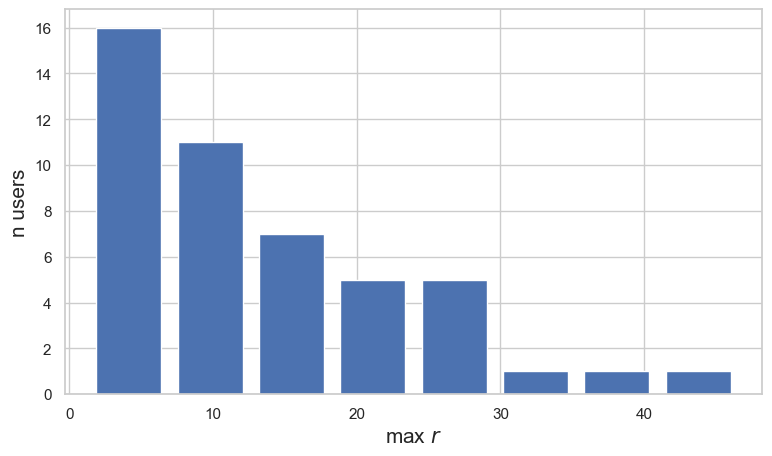

In [816]:
sns.set(style="whitegrid", rc={"figure.figsize": (9, 5)})
plt.hist(md_df['maximum_distance'], bins=8, rwidth=0.8)
plt.xlabel('max $r$', fontsize=15)
plt.ylabel('n users', fontsize=15)
plt.savefig("max_distance.png", dpi=300, bbox_inches="tight")
plt.show()


### Distanza totale percorsa in linea d'aria
Con la funzione *distance_straight_line* calcoliamo la distanza totale percorsa da ogni individuo usando una straight line(in linea d'aria) per evitare troppo calcolo computazionale.

In [230]:
from skmob.measures.individual import distance_straight_line

In [231]:
dsl_df = distance_straight_line(tdf)
dsl_df.head()

100%|██████████| 47/47 [00:00<00:00, 74.17it/s]


,uid,distance_straight_line
0,5514,1298.344622
1,69887,1010.921517
2,89001,1247.546138
3,89909,957.141080
4,120617,895.464187


Vediamo quali sono i 10 utenti che hanno percorso la distanza maggiore

In [232]:

ranked_df = dsl_df.sort_values(by='distance_straight_line', ascending=False).reset_index(drop=True)
ranked_df[:10]

,uid,distance_straight_line
0,134643,2926.532436
1,764720,2849.066767
2,702805,2344.121201
3,850911,2206.493303
4,188859,2107.428879
5,424643,2086.587947
6,261668,1888.737807
7,269269,1835.095167
8,742889,1741.637789
9,865983,1703.696107


In [ ]:
fig = plt.figure()
plt.hist(dsl_df['distance_straight_line'], bins=20, rwidth=0.8)
plt.xlabel('sld', fontsize=15)
plt.ylabel('# users', fontsize=15)
plt.show()

### Distanza massima percorsa da casa
Tramite dati di mobilità possiamo inferire dove vive un utente, per esempio vedendo le fermate notturne o facendo clustering. Con il modulo *max_distance_from_home* prima inferisce la Home location dell'utente e poi calcola distanza massima percorsa da casa. Cioè il punto più lontano raggiunto prendendo come riferimento la casa. 

In [810]:
from skmob.measures.individual import max_distance_from_home

In [ ]:
mdh_df = max_distance_from_home(tdf) 
mdh_df

In [ ]:
#Vediamo quali sono i 10 utenti che hanno fatto la distanza maggiore da casa
ranked_df = mdh_df.sort_values(by='max_distance_from_home', ascending=False).reset_index(drop=True)
ranked_df[:10] 

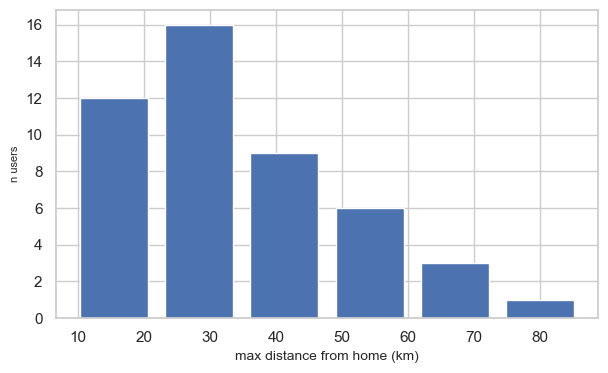

In [814]:
sns.set(style="whitegrid", rc={"figure.figsize": (7, 4)})
plt.hist(mdh_df['max_distance_from_home'], bins=6, rwidth=0.8)
plt.xlabel('max distance from home (km)', fontsize=10)
plt.ylabel('n users', fontsize=8)
plt.savefig("max_dist_homedh.png", dpi=300, bbox_inches="tight") 
plt.show()

### Radius of gyration $r_g$
Distanza caratteristica percorsa da un individuo dove abbiamo un vettore posizione del centro di massa dell'insieme delle posizioni visitate dall'individuo.

In [42]:
from skmob.measures.individual import radius_of_gyration

In [ ]:
rg_df = radius_of_gyration(fc_tdf)
rg_df.head(20)

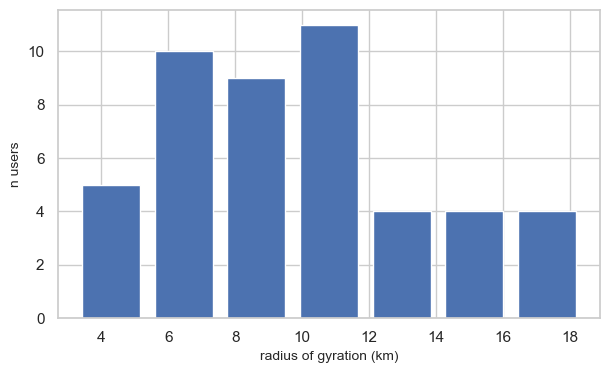

In [51]:
sns.set(style="whitegrid", rc={"figure.figsize": (7, 4)})
plt.hist(rg_df['radius_of_gyration'], bins=7, rwidth=0.8)
plt.xlabel('radius of gyration (km)', fontsize=10)
plt.ylabel('n users', fontsize=10)
plt.savefig("radius.png", dpi=300, bbox_inches="tight")
plt.show()

<a id="krg"></a>
### $k$-radius of gyration $r_g^{(k)}$   
Vediamo una variante del radius_of_gyration chiamata k-radius of gyration che è il radius of gyration applicata la centro di massa  delle k locazioni più visitate dall'utente

In [310]:
from skmob.measures.individual import k_radius_of_gyration

In [311]:
krg_df = k_radius_of_gyration(tdf, k=2)  #impostiamo un k=2

100%|██████████| 47/47 [00:01<00:00, 44.37it/s]


In [312]:
krg_df.head()

,uid,2k_radius_of_gyration
0,5514,0.862710
1,69887,0.953907
2,89001,3.187796
3,89909,0.620992
4,120617,2.465424


In [313]:
rgs_df = pd.merge(rg_df, krg_df, on='uid')
rgs_df.head()
len(rgs_df)

47

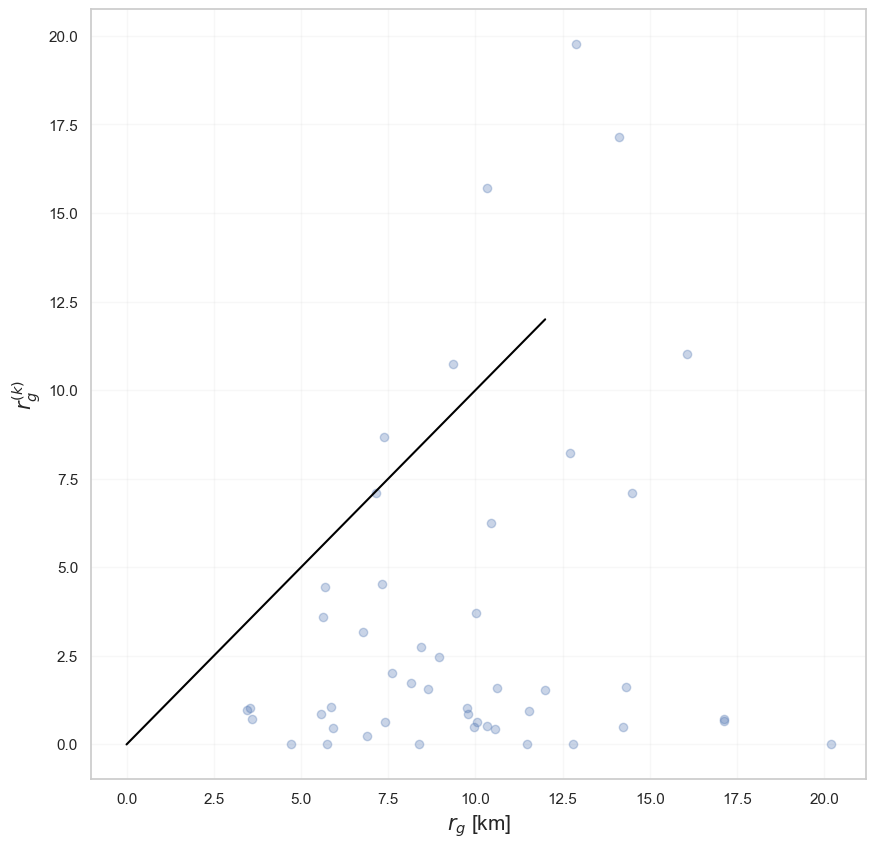

In [314]:
fig = plt.figure(figsize=(10, 10))
plt.scatter(rgs_df['radius_of_gyration'], rgs_df['2k_radius_of_gyration'], marker='o', alpha=0.3)
plt.xlabel('$r_g$ [km]', fontsize=15)
plt.ylabel('$r_g^{(k)}$', fontsize=15)
plt.grid(alpha=0.15)
plt.plot([0, 12], [0, 12], color="black")
plt.show()

Guardando il plot, si vedono gli utenti definiti explorer sull'asse delle x e i returners sparpagliati sulla bisettrice.
Gli "explorers" sono individui che tendono a esplorare nuove aree piuttosto che ritornare frequentemente agli stessi luoghi.
I "returners" sono individui che tendono a ritornare frequentemente agli stessi luoghi. 
Il fatto di avere un plot così rumoroso potrebbe essere dovuto al fatto che le dimensioni dei radius of gyration sono relativamente piccole

### Frequenza di visita a una locazione
Attraverso la funzione `location_frequency` calcoliamo la frequenza di visita di ciascun utente ad una specifica locazione. La frequenza è calcolata in percentuale.

In [257]:
from skmob.measures.individual import location_frequency

In [258]:
lf_df = location_frequency(tdf, normalize=True).reset_index()
lf_df.head()

100%|██████████| 47/47 [00:00<00:00, 109.18it/s]


,uid,lat,lng,location_frequency
0,5514,43.781690,11.278147,0.000745
1,5514,43.767727,11.288143,0.000745
2,5514,43.808694,11.251348,0.000745
3,5514,43.746792,11.286986,0.000745
4,5514,43.766239,11.280128,0.000745


### real entropy

Questa misura ci permette di calcolare la prevedibilità di un individuo nella dimensione spaziale

In [65]:
from skmob.measures.individual import real_entropy, uncorrelated_entropy

In [161]:
#start_date = '2019-02-04'
#end_date = '2019-02-06'

#filtered = fc_tdf[(fc_tdf['Date'] >= start_date) & (fc_tdf['Date'] <= end_date)]

In [162]:
tdf_sort = fc_tdf.sort_values(by=['datetime'], ascending=True)

In [163]:
s_unc_df = real_entropy(tdf_sort)
s_unc_df.head()

100%|██████████| 44/44 [00:00<00:00, 136.12it/s]


,uid,real_entropy
0,5514,7.951564
1,69887,5.338111
2,89001,6.205840
3,89909,6.224983
4,120617,6.224983


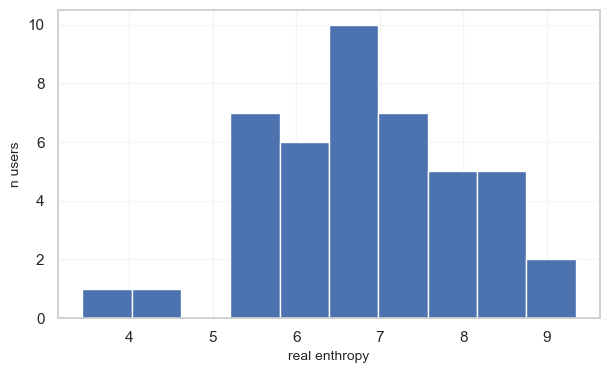

In [164]:
plt.hist(s_unc_df['real_entropy'])
plt.ylabel('n users', fontsize=10)
plt.xlabel('real enthropy', fontsize=10)
plt.grid(alpha=0.2)
plt.savefig("enthropy.png", dpi=300, bbox_inches="tight")
plt.show()

In [151]:
n_unique_locs = len(tdf_sort[['lat', 'lng']].drop_duplicates())
print("Number of unique lat-lon pairs:", n_unique_locs)

Number of unique lat-lon pairs: 7401


### Location Frequency

In [120]:
from skmob.measures.individual import location_frequency

In [124]:
lf_df = location_frequency(fc_tdf, normalize=False).reset_index()

print(lf_df.tail())

100%|██████████| 47/47 [00:00<00:00, 181.30it/s]

          uid        lat        lng  location_frequency
81173  891366  43.773119  11.157083                   1
81174  891366  43.773107  11.161855                   1
81175  891366  43.773105  11.186654                   1
81176  891366  43.773091  11.150198                   1
81177  891366  43.987032  11.212401                   1


### Jump length

In [818]:
from skmob.measures.individual import jump_lengths

In [819]:
tdf_sort = fc_tdf.sort_values(by=['datetime'], ascending=True)

In [ ]:
jl_df = jump_lengths(tdf_sort)
jl_df

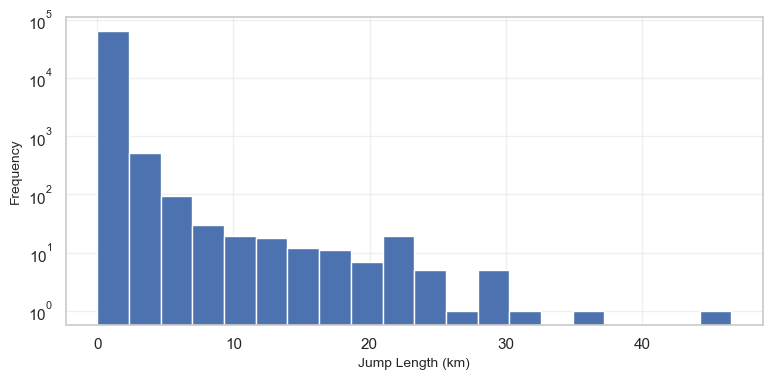

In [844]:
import matplotlib.pyplot as plt
import numpy as np

all_jump_lengths = np.concatenate(jl_df['jump_lengths'].values)

plt.figure(figsize=(9, 4))
plt.hist(all_jump_lengths, bins=20)
plt.xlabel('Jump Length (km)', fontsize=10)
plt.ylabel('Frequency', fontsize=10)
plt.yscale('log')  
plt.grid(alpha=0.3)
plt.savefig("jumps_log.png", dpi=300, bbox_inches="tight")
plt.show()

### Individual mobility network
In questo network di mobilità individuali, i nodi rappresentano le località visitate dagli utenti e gli archi diretti i percorsi.

In [266]:
from skmob.measures.individual import individual_mobility_network

In [267]:
imn_df = individual_mobility_network(tdf)
imn_df.head()

100%|██████████| 47/47 [00:00<00:00, 65.94it/s]


,uid,lat_origin,lng_origin,lat_dest,lng_dest,n_trips
0,5514,43.768072,11.287648,43.768419,11.287818,1
1,5514,43.768419,11.287818,43.768434,11.292807,1
2,5514,43.768434,11.292807,43.768000,11.296633,1
3,5514,43.768000,11.296633,43.768058,11.296517,1
4,5514,43.768058,11.296517,43.768315,11.294220,1


In [268]:
type(imn_df)

pandas.core.frame.DataFrame

In [269]:
an_imn = imn_df
an_imn.sort_values(by='n_trips', ascending=False).head()

,uid,lat_origin,lng_origin,lat_dest,lng_dest,n_trips
11371,134643,43.729636,10.604698,43.729636,10.604699,3
11884,134643,43.729618,10.604745,43.729619,10.604745,2
52638,515060,43.726927,11.247981,43.726926,11.247983,2
1029,5514,43.772991,11.152051,43.772990,11.152051,2
11496,134643,43.729621,10.604693,43.729621,10.604692,2


In [270]:
import networkx as nx
from tqdm import tqdm

In [277]:
a_user_imn_df = imn_df[imn_df['uid'] == 5514]
print(len(a_user_imn_df))
a_user_imn_df.head()

5184


,uid,lat_origin,lng_origin,lat_dest,lng_dest,n_trips
0,5514,43.768072,11.287648,43.768419,11.287818,1
1,5514,43.768419,11.287818,43.768434,11.292807,1
2,5514,43.768434,11.292807,43.768000,11.296633,1
3,5514,43.768000,11.296633,43.768058,11.296517,1
4,5514,43.768058,11.296517,43.768315,11.294220,1


In [278]:
g = nx.DiGraph()

In [279]:
for i, row in a_user_imn_df.iterrows():
    origin = (row['lat_origin'], row['lng_origin'])
    destination = (row['lat_dest'], row['lng_dest'])
    g.add_edge(origin, destination, weight=row['n_trips'])

In [ ]:
nx.draw(g, node_size=3, node_color="skyblue")

## Analisi Misure collettive
sono calcolate sulle traiettorie aggregate di tutti gli individui per quantificare pattern di movimento collettivi

### Visite per località
numero di visite per una specifica località fatta dalla popolazione degli individui del dataset

In [263]:
from skmob.measures.collective import visits_per_location

In [264]:
vpl_df = visits_per_location(fc_tdf)
vpl_df.head(20)

,lat,lng,n_visits
0,43.727513,11.093712,2
1,43.796023,11.202703,2
2,43.770546,11.184762,2
3,43.774156,11.155744,2
4,43.773587,11.158676,2
5,43.773009,11.161870,2
6,43.631996,11.000370,1
7,43.774085,11.147442,1
8,43.774084,11.221796,1
9,43.774084,11.153503,1


Text(0.5, 0, 'number of visits')

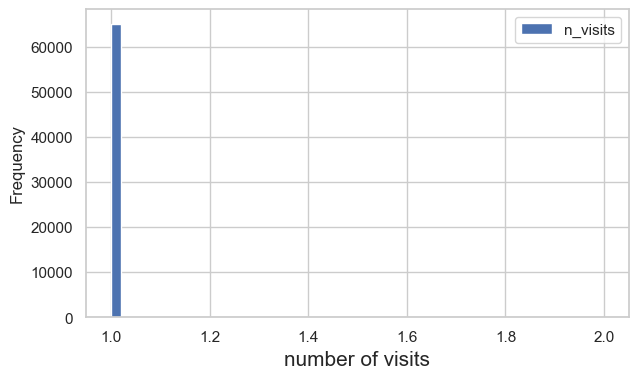

In [265]:
vpl_df.plot(kind='hist', y='n_visits', bins=50)
plt.xlabel('number of visits', fontsize=15)

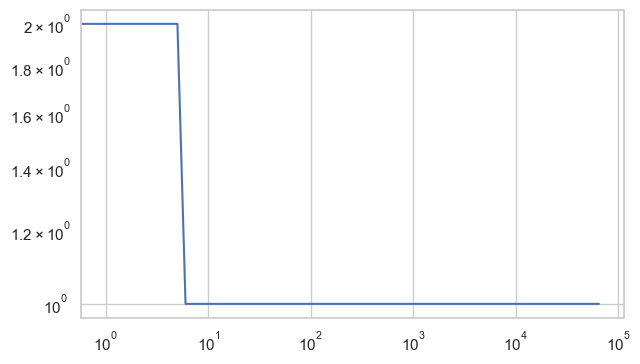

In [266]:
vpl_df['n_visits'].plot()
plt.loglog()
plt.show()

Visualizziamo su una mappa dove si trovano alcune di queste locazioni (le prime mille). La dimensione dei cerchi che folium va a disegnare sulla mappa è proporzionale al numero di visite in quella locazione. 

In [285]:
vpl_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81172 entries, 0 to 81171
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lat       81172 non-null  float64
 1   lng       81172 non-null  float64
 2   n_visits  81172 non-null  int64  
dtypes: float64(2), int64(1)
memory usage: 1.9 MB


In [286]:
vpl_df['n_visits'] = vpl_df['n_visits'].astype(int) 

In [287]:
import folium
map_f = folium.Map(location=[ 43.7696, 11.2558], zoom_start=9)

In [288]:
for idx, (i, row) in enumerate(vpl_df.iterrows()):
    if idx >= 5000:  
        break
    folium.Circle(
        radius=row['n_visits'],
        location=[row['lat'], row['lng']],
        color="orange",
        popup=row['n_visits'],
        fill=True,
    ).add_to(map_f)

In [ ]:
map_f

### Case per località

La funzione *homes_per_location* individua le locazioni delle case dei vari individui del dataset

In [290]:
from skmob.measures.collective import homes_per_location

In [291]:
hpl_df = homes_per_location(fc_tdf)


100%|██████████| 47/47 [00:00<00:00, 107.62it/s]


In [292]:
hpl_df.head()

,lat,lng,n_homes
0,43.631996,11.000370,1
1,43.764586,11.200630,1
2,43.712240,11.058674,1
3,43.712352,11.060693,1
4,43.712375,11.058959,1


Visualizziamo dove si trovano le homes sulla mappa.

In [293]:
map_f = folium.Map(location=[ 43.7696, 11.2558], zoom_start=9)

In [294]:
for i in range(len(hpl_df)):
    folium.Circle(
    radius=20,
    location=[hpl_df['lat'].iloc[i], hpl_df['lng'].iloc[i]],
    color="crimson",
    fill=True,
    ).add_to(map_f)

In [295]:
map_f

### Visite per unità di tempo

Vediamo l'andamento temporale delle visite aggregate per tutti individui del dataset.
Il plot che è restituito dalla funzione *visits_per_time_unit* con l'unità di tempo impostata a 1 ora, mette in evidenzia alcune tendenze interessanti:
1. I giorni infrasettimanali (2-6 aprile) hanno un numero maggiore di visite rispetto ai giorni del fine settimana (1 e 7 aprile). Questo indica, come ci saremmo aspettati, che durante i giorni lavorativi il traffico stradale è maggiore.
2. Durante le singole giornate, vediamo un crollo del traffico durante le ore notturne e due picchi durante la giornata che potrebbero corrispondere all'ora di punta mattutina e quella del tardo pomeriggio.


In [30]:
from skmob.measures.collective import visits_per_time_unit

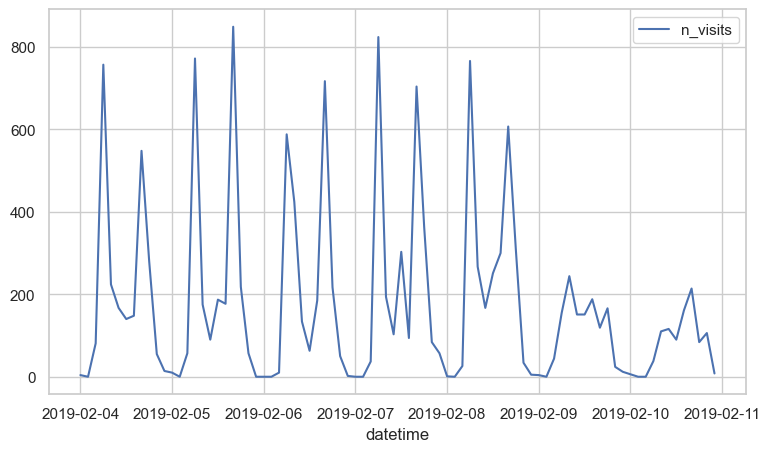

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt
start_date = '2019-02-04'
end_date = '2019-02-10'

filtered = fc_tdf[(fc_tdf['Date'] >= start_date) & (fc_tdf['Date'] <= end_date)]

sns.set(style="whitegrid", rc={"figure.figsize": (9, 5)})  


sns.lineplot(data=visits_per_time_unit(filtered, time_unit='2h'))
plt.savefig("1weeksVisits.png", dpi=300, bbox_inches="tight")    
plt.show()

#### Visualizzazione mappa tessellata della Toscana

In [99]:
tessellation = gpd.read_file("/Users/Andre/Desktop/Internship/TessellationToscana.geojson") 
tessellation.head(2)

,COD_COMUNE,NO,NAME,Cod_Provincia,Cod_Regione,Nome_Comune,Nome_Provincia,Nome_Regione,geometry
0,45001.0,45001000,Aulla,45.0,9.0,Aulla,Massa-Carrara,Toscana,"POLYGON ((9.97566 44.16410, 9.96647 44.16943, ..."
1,45002.0,45002000,Bagnone,45.0,9.0,Bagnone,Massa-Carrara,Toscana,"POLYGON ((9.99033 44.37321, 10.00467 44.37719,..."


### Visualizziamo le traiettorie 

In [298]:
fc_tdf['uid'].nunique()

47

In [ ]:
map_f = fc_tdf.plot_trajectory(zoom=13, max_users=50, start_end_markers=False) #visualizza le traiettorie dei 50 utenti
map_f

### random_location_entropy

In [235]:
from skmob.measures.collective import uncorrelated_location_entropy

In [238]:
rle_df = uncorrelated_location_entropy(fc_tdf, show_progress=True).sort_values(by='uncorrelated_location_entropy', ascending=False)

100%|██████████| 65062/65062 [00:33<00:00, 1957.93it/s]


In [ ]:
fig = plt.figure(figsize=(6, 6))
plt.hist(rle_df['uncorrelated_location_entropy'])
plt.xlabel('r [km]', fontsize=15)
plt.ylabel('P(r)', fontsize=15)
plt.grid(alpha=0.15)
plt.show()

### Homes_location
Compute the home location of a set of individuals in a TrajDataFrame. The home location of an individual is defined as the location visits the most during nighttime 

In [195]:
import skmob
from skmob.measures.individual import home_location
hl_df = home_location(fc_tdf, start_night='22:00', end_night='6:00')

100%|██████████| 47/47 [00:00<00:00, 139.94it/s]


In [ ]:
import folium

map_f = folium.Map(location=[43.7696, 11.2558], zoom_start=9)

for index, row in hl_df.iterrows():
    folium.Circle(
        radius=20,
        location=[row['lat'], row['lng']],
        color="crimson",
        fill=True,
        popup=f"UID: {row['uid']}"
    ).add_to(map_f)

map_f


In [204]:
tessellation=gpd.read_file('Internship/TessellationToscana.geojson', driver='GeoJSON')

In [206]:
hl_gdf = gpd.GeoDataFrame(
    hl_df,
    geometry=gpd.points_from_xy(hl_df['lng'], hl_df['lat']),
    crs='EPSG:4326'  
)

In [207]:
hl_tessellation=gpd.sjoin(hl_gdf,tessellation, how='left', predicate='within') #uso within perché voglio solo i punti DENTRO i plogoni

In [ ]:
hl_tessellation

In [216]:
tile_point_counts = hl_tessellation.groupby('index_right').size()

In [ ]:
tile_point_counts

In [218]:
tessellation['n_points'] = tile_point_counts

In [222]:
tessellation_h = tessellation.dropna(subset=['n_points'])

In [224]:
tessellation_h = tessellation.to_crs(hl_gdf.crs)

In [ ]:
tessellation_h

In [226]:
import altair as alt

tessellation_h =tessellation_h.to_crs(epsg=4326)


geojson = json.loads(tessellation_h.to_json())


chart = alt.Chart(alt.Data(values=geojson["features"])).mark_geoshape(stroke='lightgrey').encode(
    color=alt.Color("properties.n_points:Q", title="Homes",scale=alt.Scale(scheme='magma', reverse=True)),
    tooltip=[alt.Tooltip("properties.Nome_Comune:N", title="Comune"),
             alt.Tooltip("properties.n_points:Q", title="Homes")]
).properties(
    width=600,
    height=500,
    title="Homes"
)


geojson = json.loads(tessellation.to_json())

base_map = alt.Chart(alt.Data(values=geojson["features"])).mark_geoshape(fill='white',stroke='lightgrey').encode(
    tooltip=alt.Tooltip("properties.Nome_Comune:N", title="Comune")
).properties(
    width=600,
    height=500,
    title="homes per comune"
)
map_h=(base_map +chart)

map_h.save('map_home.html')
map_h.show()

alt.LayerChart(...)

In [276]:
fc_tdf.columns

Index(['id', 'Date', 'DeltaPos', 'Heading', 'uid', 'lat', 'lng',
       'PanelSession', 'Speed', 'Time', 'datetime', 'geometry', 'cluster_id'],
      dtype='object')

In [278]:
fc_tdf.drop(columns='cluster_id', inplace=True)

In [ ]:
fc_tdf.tail(50)

## Clustering, Heatmap & visualizzazione Traiettorie

### Visualizzazione traiettorie

In [377]:
fc2_tdf=fc_tdf

In [387]:
fc2_tdf = fc2_tdf.sort_values(by=['uid', 'datetime'])

# Calcoliamo la timediffrence in secondi per ogni 'uid'
fc2_tdf['time_diff'] = fc2_tdf.groupby('uid')['datetime'].diff().dt.total_seconds()

#Definiamo una nuovo trajectory id ogni volta che il gap è sopra i 20 minuti
#cumsum() su un booleano dà un nuovo tid ogni volta che trova un True!
time_gap_threshold = 20 * 60  # 20 minuti
fc2_tdf['tid'] = (
    (fc2_tdf['time_diff'] > time_gap_threshold).cumsum()
)


fc2_tdf = fc2_tdf.drop(columns=['time_diff'])

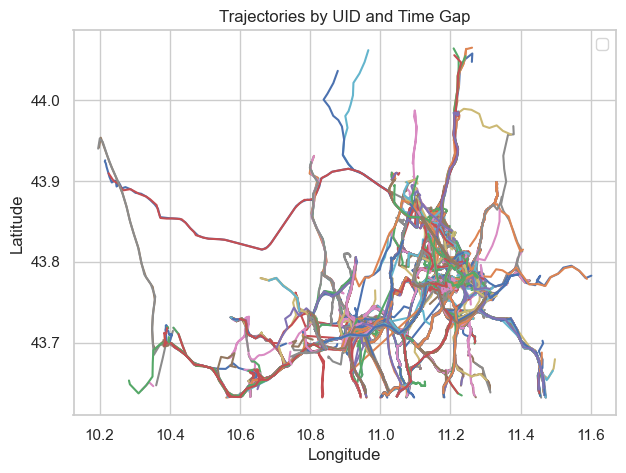

In [388]:
import matplotlib.pyplot as plt

for (uid, traj_id), group in fc2_tdf.groupby(['uid', 'tid']):
    plt.plot(group['lng'], group['lat'],)

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.title('Trajectories by UID and Time Gap')
plt.show()
plt.close()

In [389]:
m = folium.Map(location=[fc2_tdf['lat'].mean(), fc2_tdf['lng'].mean()],
               zoom_start=9, 
               tiles='CartoDB positron')

for (uid, tid), group in fc2_tdf.groupby(['uid', 'tid']):
    coords = list(zip(group['lat'], group['lng']))
    if len(coords) >= 2:
        folium.PolyLine(
            coords,  
            color='red',
            weight=1,
            opacity=0.3
        ).add_to(m)

m.save('trajectories.html')
m

In [ ]:
import folium
from shapely.geometry import LineString
import geopandas as gpd

def create_geodataframe(df):
    lines = []
    for (uid, tid), group in df.groupby(['uid', 'tid']):
        coords = list(zip(group['lng'], group['lat']))
       
        if len(coords) >= 2:
            line = LineString(coords)
            lines.append({'uid': uid, 'tid': tid, 'geometry': line})
        else:
            
            pass
    
    return gpd.GeoDataFrame(lines, crs="EPSG:4326")  # assuming WGS84

geo_df = create_geodataframe(fc2_tdf)


m = folium.Map(location=[fc2_tdf['lat'].mean(), fc2_tdf['lng'].mean()],
               zoom_start=9, 
               tiles='CartoDB positron')

for _, row in geo_df.iterrows():
    folium.GeoJson(
        row['geometry'],
        style_function=lambda x: {
            'color': 'red',  
            'weight': 1,
            'opacity': 0.5
        }
    ).add_to(m)

m.save('trajectories.html')
m


### Traiettorie Outbound & inbound Firenze

In [391]:
from geopy.distance import geodesic

location_florence = (43.7696, 11.2558)
DISTANCE_THRESHOLD_KM = 12.0

m = folium.Map(location=[43.7696, 11.2558], zoom_start=10, tiles='CartoDB positron')


for (uid, tid), group in fc2_tdf.groupby(['uid', 'tid']):
    coords = list(zip(group['lat'], group['lng']))  
    if len(coords) >= 2:
        last_point = coords[-1]
        dist = geodesic(last_point, location_florence).km
        color = 'red' if dist <= DISTANCE_THRESHOLD_KM else 'blue'
        folium.PolyLine(locations=coords, color=color, weight=3, opacity=0.1).add_to(m)

m.save('in_out_Florence.html')
m


In [ ]:
from shapely.geometry import LineString
from geopy.distance import geodesic


location_florence = (43.7696, 11.2558)  
DISTANCE_THRESHOLD_KM = 12.0  

def create_linesgdp(df):
    lines = []
    for (uid, tid), group in df.groupby(['uid', 'tid']):
        coords = list(zip(group['lng'], group['lat']))
        if len(coords) >= 2:
            line = LineString(coords)
            lines.append({
                'uid': uid,
                'tid': tid,
                'geometry': line
            })
    return gpd.GeoDataFrame(lines, crs="EPSG:4326")

def ends_in_florence(line, city_location, radius_km=DISTANCE_THRESHOLD_KM):
    last_coord = line.coords[-1]
    dist = geodesic((last_coord[1], last_coord[0]), city_location).km
    return dist <= radius_km


geo_df = create_linesgdp(fc2_tdf)


m = folium.Map(
    location=[43.7696, 11.2558], 
    zoom_start=10,
    tiles='CartoDB positron'
)


for _, row in geo_df.iterrows():
    line = row['geometry']
    
    if ends_in_florence(line, location_florence):
        color = 'red'
    else:
        color = 'blue'
    
    folium.GeoJson(
        data=line,
        style_function=lambda x, col=color: {
            'color': col,
            'weight': 4,
            'opacity': 0.1
        }
    ).add_to(m)

m

### Heatmap

In [396]:
from folium.plugins import HeatMap

heatmap_points = []
for point in fc2_tdf['geometry']:
    for coord in point.coords:
        heatmap_points.append([coord[1], coord[0]])  

m = folium.Map(
    location=[fc2_tdf['lat'].mean(), fc2_tdf['lng'].mean()],
    zoom_start=10,
    tiles='CartoDB dark_matter'
)

HeatMap(
    data=heatmap_points,
    radius=8,
    blur=10,
    max_zoom=1,
    gradient={0.3: 'blue', 0.45: 'lightblue', 0.65: 'lime', 0.7: 'darkgreen', 0.77: 'yellow', 0.8: 'orange', 0.85: 'red', 0.9: 'purple'}
).add_to(m)

m.save('trajectory_heatmap.html')
m

### clustering 

https://towardsdatascience.com/gps-trajectory-clustering-with-python-9b0d35660156

In [398]:
def create_linesGeoDataFrame(tdf):
    lines = []
    for (uid, tid), group in df.groupby(['uid', 'tid']):
        coords = list(zip(group['lng'], group['lat']))
        if len(coords) >= 2:
            line = LineString(coords)
            lines.append({'uid': uid, 'tid': tid, 'geometry': line})
    return gpd.GeoDataFrame(lines, crs="EPSG:4326") 

lines_gdf = create_geodataframe(fc2_tdf)

In [572]:
lines=[]
for (uid,tid), traj in fc2_tdf.groupby(['uid', 'tid']):
    coordinates=list(zip(traj['lng'], traj['lat']))
    if len(coordinates)>1:
       line=LineString(coordinates)
       lines.append({'uid': uid, 'tid': tid, 'geometry': line})
lines_gdf=gpd.GeoDataFrame(lines,crs="EPSG:4326") 

In [573]:
lines_gdf.head()

,uid,tid,geometry
0,5514,0,"LINESTRING (11.28773 43.76825, 11.29281 43.768..."
1,5514,1,"LINESTRING (11.15674 43.77238, 11.16028 43.770..."
2,5514,2,"LINESTRING (11.28217 43.76967, 11.28363 43.771..."
3,5514,3,"LINESTRING (11.25227 43.77762, 11.25112 43.776..."
4,5514,4,"LINESTRING (11.24213 43.79068, 11.23952 43.789..."


In [574]:
lines_gdf['cent_lng'] = lines_gdf.geometry.centroid.x
lines_gdf['cent_lat'] = lines_gdf.geometry.centroid.y

In [575]:
lines_gdf

,uid,tid,geometry,cent_lng,cent_lat
0,5514,0,"LINESTRING (11.28773 43.76825, 11.29281 43.768...",11.227220,43.774613
1,5514,1,"LINESTRING (11.15674 43.77238, 11.16028 43.770...",11.222743,43.772902
2,5514,2,"LINESTRING (11.28217 43.76967, 11.28363 43.771...",11.276405,43.782484
3,5514,3,"LINESTRING (11.25227 43.77762, 11.25112 43.776...",11.251664,43.785139
4,5514,4,"LINESTRING (11.24213 43.79068, 11.23952 43.789...",11.253650,43.779245
...,...,...,...,...,...
3345,891366,3723,"LINESTRING (11.14682 43.77354, 11.15083 43.772...",11.179446,43.778185
3346,891366,3724,"LINESTRING (11.21625 43.79404, 11.21416 43.793...",11.179404,43.779293
3347,891366,3725,"LINESTRING (11.14415 43.77318, 11.15001 43.773...",11.180010,43.778713
3348,891366,3726,"LINESTRING (11.21622 43.79404, 11.21411 43.792...",11.179949,43.779326


In [489]:
#aggiungiamo il punto di partenza e di arrivo al clustering
lines_gdf['start_lng'] = lines_gdf.geometry.apply(lambda line: line.coords[0][0])
lines_gdf['start_lat'] = lines_gdf.geometry.apply(lambda line: line.coords[0][1])

lines_gdf['end_lng'] = lines_gdf.geometry.apply(lambda line: line.coords[-1][0])
lines_gdf['end_lat'] = lines_gdf.geometry.apply(lambda line: line.coords[-1][1])

In [576]:
#aggiungiamo il punto di partenza e di arrivo per il clustering
lines_gdf['start_lng'] = [line.coords[0][0] for line in lines_gdf.geometry]
lines_gdf['start_lat'] = [line.coords[0][1] for line in lines_gdf.geometry]
lines_gdf['end_lng']   = [line.coords[-1][0] for line in lines_gdf.geometry]
lines_gdf['end_lat']   = [line.coords[-1][1] for line in lines_gdf.geometry]

In [414]:
from shapely.geometry import LineString
from sklearn.cluster import DBSCAN
db = DBSCAN(eps=0.002, min_samples=2)
clusters = db.fit_predict(lines_gdf[['x','y']])

In [415]:
lines_gdf['cluster'] = clusters

In [416]:
lines_gdf['cluster'].unique()

array([  0,  -1,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,
        12,  13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,
        25,  26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,
        38,  39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,
        51,  52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,
        64,  65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,
        77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,
        90,  91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102,
       103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115,
       116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128,
       129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141,
       142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154,
       155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167,
       168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 17

In [ ]:
ax = lines_gdf.plot(column='cluster', categorical=True, legend=True, figsize=(10, 6))
ax.set_title("Clustered Trajectories (by Line Centroid)")
ax.set_axis_off()

In [433]:
feature_cols = ['start_lat', 'start_lng', 'end_lat', 'end_lng', 'cent_lng', 'cent_lat']

In [ ]:
unique_clusters = lines_gdf['cluster'].unique()
num_clusters = len(unique_clusters)

lines_gdf_clean=lines_gdf[lines_gdf['cluster']>=0]
color_list = [
    'red', 'blue', 'green', 'purple', 'orange', 'darkred',
    'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue',
    'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen',
    'gray', 'lightgray', 'brown', 'cyan', 'magenta',
    'yellow', 'gold', 'darkorange', 'lightgreen', 'navy',
    'maroon', 'olive', 'teal', 'lime', 'indigo', 'violet',
    'turquoise', 'salmon', 'coral', 'orchid', 'khaki',
    'plum', 'tan', 'steelblue', 'peru', 'sienna', 'crimson',
    'deeppink', 'darkslateblue', 'darkcyan', 'darkgoldenrod',
    'dodgerblue', 'firebrick', 'forestgreen', 'fuchsia', 'gainsboro',
    'ghostwhite', 'goldenrod', 'hotpink', 'ivory', 'lavender',
    'linen', 'mediumseagreen', 'midnightblue', 'moccasin',
    'navajowhite', 'oldlace', 'orchid', 'palegoldenrod',
    'palegreen', 'paleturquoise', 'palevioletred', 'papayawhip',
    'peachpuff', 'peru', 'powderblue', 'rosybrown', 'royalblue',
    'saddlebrown', 'sandybrown', 'seagreen', 'seashell',
    'sienna', 'skyblue', 'slateblue', 'slategray', 'snow',
    'springgreen', 'steelblue', 'tan', 'thistle', 'tomato', 'turquoise', 'wheat', 'whitesmoke', 'yellowgreen'
]

cluster_color_mapping = {cluster: color_list[i % len(color_list)] for i, cluster in enumerate(unique_clusters)}



def style_function(feature, color):
    return {
        'color': color,
        'weight': 2,       
        'opacity': 0.3     
    }


florence_lat = 43.7696
florence_lng = 11.2558


m = folium.Map(
    location=[florence_lat, florence_lng],
    zoom_start=10,
    tiles='CartoDB dark_matter' 
)


trajectories_fg = folium.FeatureGroup(name='Trajectories')


for _, row in lines_gdf_clean.iterrows():
    
    cluster_id = row['cluster']
    
    #
    color = cluster_color_mapping.get(cluster_id, 'black')  
    
    
    folium.GeoJson(
        row['geometry'],
        style_function=partial(style_function, color=color),
        tooltip=folium.Tooltip(f"UID: {row['uid']}, Segment: {row['tid']}, Cluster: {cluster_id}")
    ).add_to(trajectories_fg)


trajectories_fg.add_to(m)

folium.LayerControl().add_to(m)
m

In [577]:
from shapely.geometry import Point
import geopandas as gpd


florence_centro = Point(11.2558, 43.7696)
florence_gdf = gpd.GeoDataFrame({'geometry': [florence_centro]}, crs='EPSG:4326') #deve essere 4326 visto che siamo in lat e lng


buffer_firenze_15 = (florence_gdf.to_crs(epsg=3857).buffer(15000).to_crs(epsg=4326)) #per fare il buffer in metri devo riproiettare in 3857 e poi riportarlo in 4326

In [514]:
print(buffer_firenze_15.geometry)

0    POLYGON ((11.39055 43.76960, 11.38990 43.76006...
dtype: geometry


In [578]:
lines_gdf['end_points'] = gpd.points_from_xy(lines_gdf['end_lng'], lines_gdf['end_lat'], crs='EPSG:4326')
lines_gdf['start_points']= gpd.points_from_xy(lines_gdf['start_lng'], lines_gdf['start_lat'], crs='EPSG:4326')

In [579]:
print("CRS of lines_gdf:", lines_gdf.crs)
print("CRS of buffer_firenze_15:", buffer_firenze_15.crs)

CRS of lines_gdf: EPSG:4326
CRS of buffer_firenze_15: EPSG:4326


In [580]:
buffer_polygon = buffer_firenze_15.geometry.iloc[0]

In [581]:
lines_gdf_end_inFlorence_start_outFlorence = lines_gdf[
    lines_gdf['end_points'].within(buffer_polygon) &
    ~lines_gdf['start_points'].within(buffer_polygon)].copy().reset_index(drop=True)

In [583]:
print(len(lines_gdf_end_inFlorence_start_outFlorence))
print(len(lines_gdf))

605
3350


In [ ]:
eps_values = [0.01,0.02,0.035,0.04, 0.05, 0.06, 0.07, 0.08, 0.09,0.1, 0.2]

for eps in eps_values:
    print(f"Testing DBSCAN with eps={eps}")
    dbscan = DBSCAN(eps=eps, min_samples=3)
    labels = dbscan.fit_predict(lines_gdf_end_inFlorence_start_outFlorence[feature_cols])
    
    unique_clusters = np.unique(labels)
    print(f"DataFrame length: {len(lines_gdf_end_inFlorence_start_outFlorence)}")
    print(f"Number of clusters (including noise/outliers): {len(unique_clusters)}")
    print(f"Cluster labels: {unique_clusters}")
    print(f"Noise points: {sum(labels == -1)}\n")

In [802]:
feature_cols = ['start_lat', 'start_lng', 'end_lat', 'end_lng', 'cent_lng', 'cent_lat']

In [803]:
db = DBSCAN(eps=0.035, min_samples=3)  
clusters = db.fit_predict(lines_gdf_end_inFlorence_start_outFlorence[feature_cols])
lines_gdf_end_inFlorence_start_outFlorence['cluster'] = clusters
lines_gdf_end_inFlorence_start_outFlorence['cluster'].unique()

array([ 0, -1,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
       16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29])

In [804]:

cluster_plot=lines_gdf_end_inFlorence_start_outFlorence[lines_gdf_end_inFlorence_start_outFlorence['cluster']>-1]

unique_clusters = cluster_plot['cluster'].unique()
color_list = [
    'red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred',
    'white', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 
    'pink', 'lightblue', 'lightgreen', 'yellow', 'brown', 
    'cyan', 'magenta', 'gold', 'lime', 'teal', 'navy', 'violet',
    'indigo', 'maroon', 'olive', 'silver', 'gray', 'charcoal',
    'beige', 'peach', 'coral', 'turquoise', 'lavender', 'salmon',
    'plum', 'khaki', 'orchid', 'tan', 'ivory', 'chocolate', 
    'sienna', 'slateblue', 'chartreuse', 'crimson', 'peru',
    'hotpink', 'firebrick', 'dodgerblue', 'forestgreen', 'mediumseagreen',
    'goldenrod', 'deeppink', 'mediumvioletred', 'darkorange', 'lightcoral',
    'mediumaquamarine', 'mediumturquoise', 'powderblue', 'rosybrown',
    'seagreen', 'springgreen', 'steelblue', 'tomato'
]

cluster_color_mapping = {cluster: color_list[i % len(color_list)] for i, cluster in enumerate(unique_clusters)}


def style_function(feature, color):
    return {
        'color': color,
        'weight': 4,
        'opacity': 0.6
    }

m = folium.Map(
    location=[43.7696, 11.2558],  
    zoom_start=10,
    tiles='CartoDB dark_matter'
)

for _, row in cluster_plot.iterrows():
    cluster_id = row['cluster']
    color = cluster_color_mapping.get(cluster_id, 'black') 
    folium.GeoJson(
        row['geometry'],
        style_function=lambda feature, color=color: style_function(feature, color),
        tooltip=f"UID: {row['uid']}, Segment: {row['tid']}, Cluster: {cluster_id}"
    ).add_to(m)

m.save('clustering_entering_Florence_starting_out_Florence.html')
m

In [795]:
from sklearn.metrics import silhouette_score
X = cluster_plot[['start_lat', 'start_lng', 'end_lat', 'end_lng', 'cent_lng', 'cent_lat']] 
sil_score = silhouette_score(X, cluster_plot['cluster'])
print(f"Silhouette Score: {sil_score:.3f}")

Silhouette Score: 0.548


In [ ]:
cluster_summary = cluster_plot.groupby('cluster')['uid'].agg(['count', list]).reset_index()
cluster_summary.rename(columns={'count': 'traj_count', 'list': 'uids'}, inplace=True)
cluster_summary

In [ ]:
from collections import defaultdict

cluster_summary = cluster_plot.groupby('cluster')['uid'].agg(list).reset_index()

uid_cluster_map = defaultdict(set)

for _, row in cluster_summary.iterrows():
    cluster_id = row['cluster']
    for uid in row['uid']:
        uid_cluster_map[uid].add(cluster_id)

uid_cluster_map = {uid: sorted(list(clusters)) for uid, clusters in uid_cluster_map.items()}

for uid, clusters in uid_cluster_map.items():
    print(f"UID {uid}: Clusters {clusters}")

In [ ]:
from collections import defaultdict


cluster_uid_map = defaultdict(set)

for uid, clusters in uid_cluster_map.items():
    for cluster in clusters:
        cluster_uid_map[cluster].add(uid)

cluster_uid_map = {cluster: sorted(list(uids)) for cluster, uids in cluster_uid_map.items()}

for cluster, uids in sorted(cluster_uid_map.items()):
    print(f"Cluster {cluster}: UIDs {uids}")
